**Table of Contents** <br>
* [1. Imports](#imports)
* [2. Self Organizing Maps](#2)



<hr>
<a class="anchor" id="Imports">
    
# 1. Imports
    
</a>

#### Initial Note:
Code from cells without a specific source mentioned is either original or adapted from: https://github.com/joaopfonseca/Data-Mining-22-23

In [33]:
#!pip install kmodes
#!pip install graphviz
import graphviz
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import KNNImputer
sns.set()
from sklearn.neighbors import LocalOutlierFactor
from sklearn import preprocessing
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
import umap
from mpl_toolkits.mplot3d import Axes3D
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.metrics import calinski_harabasz_score
import seaborn as sb
from kmodes.kprototypes import KPrototypes
from matplotlib.lines import Line2D
from sklearn.tree import export_graphviz
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans


from sklearn_extra.cluster import KMedoids
# ! pip install scikit-learn-extra
# ! pip install sklearn-extra

In [34]:
df = pd.read_csv('df.csv',index_col=[0])

In [35]:
df_outliers_ohc = pd.read_csv('df_outliers_ohc.csv',index_col=[0])

In [36]:
df.head()

,ClaimsRate,Age,MotorPercentageSpent,HouseholdPercentageSpent,HealthPercentageSpent,LifePercentageSpent,WorkPercentageSpent,SalarySpent,EducDeg_2.0,EducDeg_3.0,EducDeg_4.0,Children_1,Cancelled_1
CustID,,,,,,,,,,,,,
1.0,-0.559322,-0.482759,0.357075,-0.257555,0.012021,0.619809,-0.177071,-0.140650,1.0,0.0,0.0,1.0,0.0
2.0,0.677966,-0.965517,-0.865761,0.978485,-0.588569,3.104708,1.449848,-1.225286,1.0,0.0,0.0,1.0,0.0
3.0,-0.745763,-0.103448,-0.372926,0.415420,-0.326120,1.419295,1.756908,-0.224922,0.0,0.0,0.0,0.0,0.0
4.0,0.457627,-0.482759,-0.308089,-0.430432,1.962267,0.414575,0.212183,-0.759114,0.0,1.0,0.0,1.0,0.0
5.0,0.305085,-0.206897,0.289338,-0.416528,0.471710,-0.089648,0.545922,-0.341952,0.0,1.0,0.0,1.0,0.0


In [37]:
df_outliers_ohc.head()

,ClaimsRate,Cancelled_1,Age,MotorPercentageSpent,HouseholdPercentageSpent,HealthPercentageSpent,LifePercentageSpent,WorkPercentageSpent,SalarySpent,EducDeg_2.0,EducDeg_3.0,EducDeg_4.0,Children_1
CustID,,,,,,,,,,,,,
52.0,25.36,0,50,0.924444,0.033167,0.049022,0.008292,-0.014925,64.358209,0.0,1.0,0.0,1.0
113.0,15.65,0,37,0.873401,0.007499,0.094195,0.006555,0.018350,47.599629,0.0,0.0,1.0,1.0
136.0,14.80,0,28,0.403681,0.220824,0.194455,0.185109,-0.004069,35.418588,0.0,1.0,0.0,1.0
150.0,0.63,0,22,0.085193,0.258926,0.038803,0.024363,0.592715,15.500131,0.0,0.0,0.0,1.0
172.0,256.20,0,27,0.582435,0.121549,0.256979,0.010614,0.028423,20.076411,0.0,1.0,0.0,1.0


<hr>
<a class="anchor" id="2">
    
# 2. Self Organizing Maps
    
</a>

For SOMs, it is generally recommended to use one-hot encoding for categorical variables, as this can help to avoid introducing a false sense of ordinality and can provide a more interpretable

For this reason we encoded our categorical variables with one hot encoder

In [38]:
insurance_features_ohc=[
    'MotorPercentageSpent',
    'HouseholdPercentageSpent',
    'HealthPercentageSpent',
    'LifePercentageSpent',
    'WorkPercentageSpent',
    'Cancelled_1',
    "ClaimsRate"
]

insurance_features_ohc_metric=[
    'MotorPercentageSpent',
    'HouseholdPercentageSpent',
    'HealthPercentageSpent',
    'LifePercentageSpent',
    'WorkPercentageSpent',
    "ClaimsRate"
]

dfInsurance=df[insurance_features_ohc]
dfInsurance_metric = df[insurance_features_ohc_metric]

demographic_features_ohc=[
    'SalarySpent',
    'Children_1',
    'EducDeg_2.0',
    'EducDeg_3.0',
    'EducDeg_4.0',
    'Age'
]
dfDemographic=df[demographic_features_ohc]

## dfInsurance

In [39]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves

# First, we will turn our data into SOM using a 

np.random.seed(42)

sm = sompy.SOMFactory().build(
    data = dfInsurance.values, # numpy arraywith the values of the dataframe 
    mapsize=[50, 50], # number of nodes in the grid
    initialization='random', # method used to initialize the weights of the SOM.
    neighborhood='gaussian', # type of neighborhood function used in the training process
    training='batch', #training algorithm used
    lattice='hexa', #type of connection that we want; hexa - hexagonal / rect - rectangle - the hexagonal can fit better to the data
    component_names=dfInsurance.columns
)
sm.train(n_job=-1, verbose='info', train_rough_len=50, train_finetune_len=50)




 Training...
 random_initialization took: 0.008000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 50

 epoch: 1 ---> elapsed time:  0.999000, quantization error: 1.491003

 epoch: 2 ---> elapsed time:  0.689000, quantization error: 2.449025

 epoch: 3 ---> elapsed time:  0.677000, quantization error: 2.426812

 epoch: 4 ---> elapsed time:  0.663000, quantization error: 2.413655

 epoch: 5 ---> elapsed time:  1.035000, quantization error: 2.398121

 epoch: 6 ---> elapsed time:  0.909000, quantization error: 2.392385

 epoch: 7 ---> elapsed time:  0.864000, quantization error: 2.388233

 epoch: 8 ---> elapsed time:  0.926000, quantization error: 2.383126

 epoch: 9 ---> elapsed time:  0.758000, quantization error: 2.377143

 epoch: 10 ---> elapsed time:  0.911000, quantization error: 2.372129

 epoch: 11 ---> elapsed time:  0.804000, quantization error: 2.368636

 epoch: 12 ---> elapsed time:  1.016000, quantization error: 2.365213

 epoch: 13 ---> 

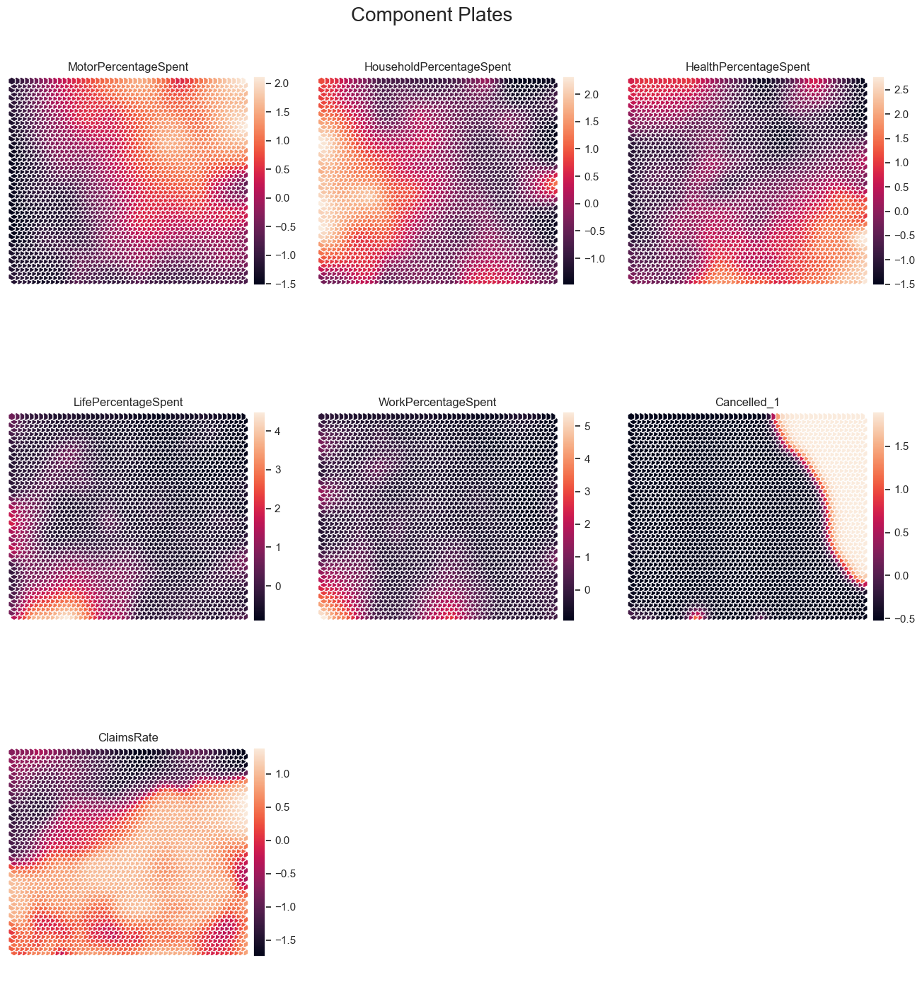

In [40]:
#Components Plates
#The components map shows the values of the variables for each prototype and allows us to extract conclusions consisting of non-linear patterns between variables.
sns.set()
view2D = View2D(100,100,"", text_size=2.8)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.95)
plt.suptitle("Component Plates", fontsize=20)
plt.show()

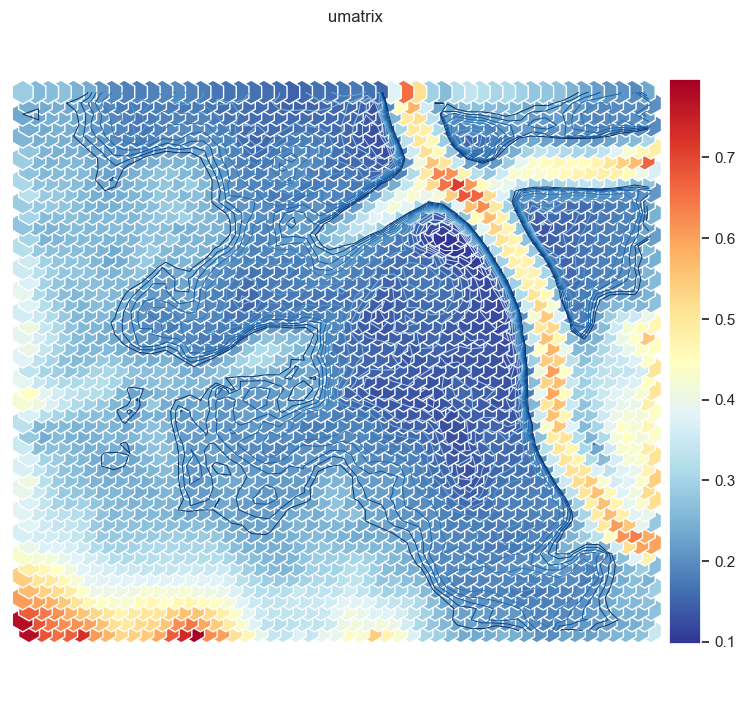

In [41]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(10, 10, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)



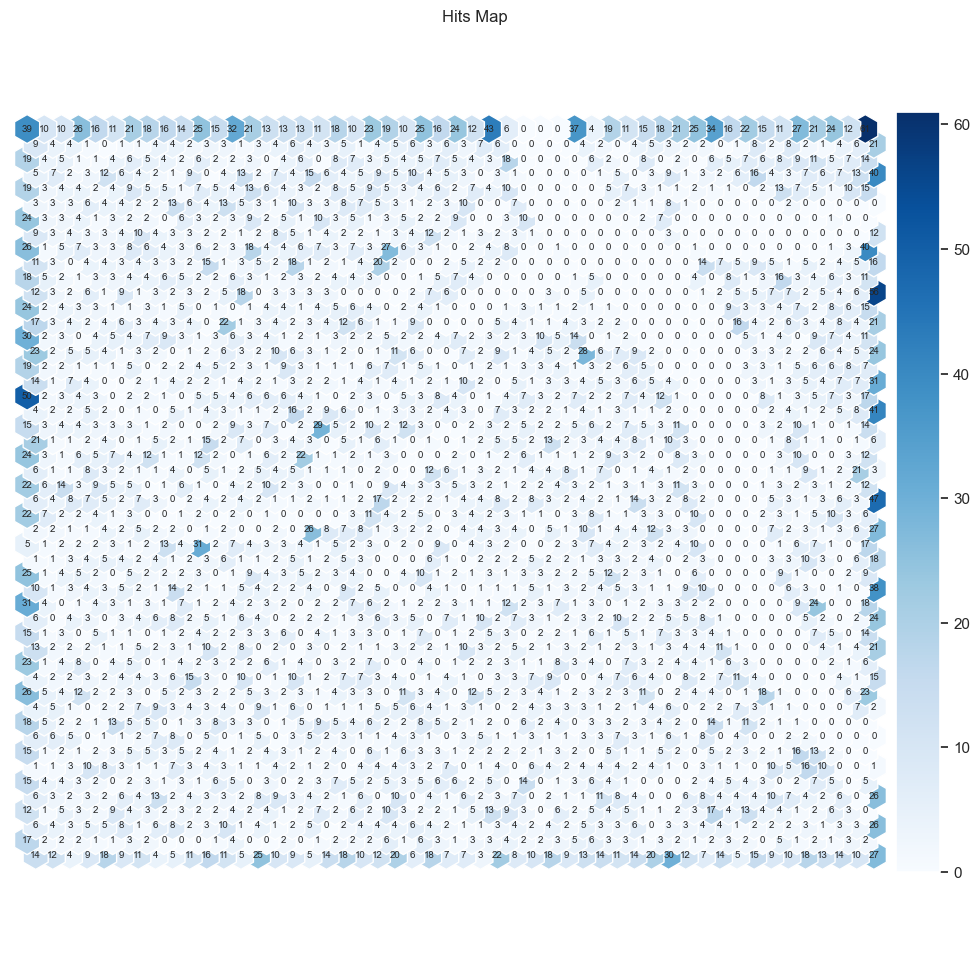

In [42]:
# Hit-Map
#Shows the frequency of each Unit in the output map
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")
plt.show()

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 1544, ncost: 27587.23801095548
Run: 1, iteration: 2/100, moves: 502, ncost: 27451.925700875472
Run: 1, iteration: 3/100, moves: 320, ncost: 27387.41718260206
Run: 1, iteration: 4/100, moves: 208, ncost: 27361.910454349905
Run: 1, iteration: 5/100, moves: 129, ncost: 27351.630977362904
Run: 1, iteration: 6/100, moves: 62, ncost: 27349.670293085168
Run: 1, iteration: 7/100, moves: 24, ncost: 27349.318883803277
Run: 1, iteration: 8/100, moves: 16, ncost: 27349.152764683553
Run: 1, iteration: 9/100, moves: 10, ncost: 27349.075058681345
Run: 1, iteration: 10/100, moves: 7, ncost: 27349.05036558345
Run: 1, iteration: 11/100, moves: 1, ncost: 27349.049638017943
Run: 1, iteration: 12/100, moves: 5, ncost: 27349.021595087514
Run: 1, iteration: 13/100, moves: 7, ncost: 27348.989372969525
Run: 1, iteration: 14/

Run: 9, iteration: 4/100, moves: 134, ncost: 27352.79192693085
Run: 9, iteration: 5/100, moves: 71, ncost: 27350.24670947043
Run: 9, iteration: 6/100, moves: 35, ncost: 27349.62152756771
Run: 9, iteration: 7/100, moves: 27, ncost: 27349.205707074732
Run: 9, iteration: 8/100, moves: 18, ncost: 27349.04804902919
Run: 9, iteration: 9/100, moves: 8, ncost: 27349.01338300543
Run: 9, iteration: 10/100, moves: 2, ncost: 27349.00900866159
Run: 9, iteration: 11/100, moves: 3, ncost: 27349.00123794367
Run: 9, iteration: 12/100, moves: 4, ncost: 27348.98720778705
Run: 9, iteration: 13/100, moves: 0, ncost: 27348.98720778705
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 10, iteration: 1/100, moves: 2188, ncost: 28593.49261591863
Run: 10, iteration: 2/100, moves: 1347, ncost: 27468.423569287686
Run: 10, iteration: 3/100, moves: 396, ncost: 27374.042627839364
Run: 10, iteration: 4/100, moves: 169, ncost: 27355.272001899077
Run: 10, iteration: 5/100, moves: 74, 

Run: 5, iteration: 3/100, moves: 515, ncost: 22869.540452740286
Run: 5, iteration: 4/100, moves: 366, ncost: 22797.16393543873
Run: 5, iteration: 5/100, moves: 259, ncost: 22763.695481903054
Run: 5, iteration: 6/100, moves: 147, ncost: 22753.720317355615
Run: 5, iteration: 7/100, moves: 93, ncost: 22750.065719250542
Run: 5, iteration: 8/100, moves: 43, ncost: 22749.16678403735
Run: 5, iteration: 9/100, moves: 25, ncost: 22748.675668273845
Run: 5, iteration: 10/100, moves: 15, ncost: 22748.455189717293
Run: 5, iteration: 11/100, moves: 13, ncost: 22748.35349868246
Run: 5, iteration: 12/100, moves: 5, ncost: 22748.316550522515
Run: 5, iteration: 13/100, moves: 0, ncost: 22748.316550522515
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 6, iteration: 1/100, moves: 2957, ncost: 24333.41319592601
Run: 6, iteration: 2/100, moves: 788, ncost: 24050.336289228333
Run: 6, iteration: 3/100, moves: 663, ncost: 23712.311065902555
Run: 6, iteration: 4/100, moves:

Run: 1, iteration: 13/100, moves: 63, ncost: 21246.870228130912
Run: 1, iteration: 14/100, moves: 25, ncost: 21246.558320072632
Run: 1, iteration: 15/100, moves: 18, ncost: 21246.33126583423
Run: 1, iteration: 16/100, moves: 5, ncost: 21246.28573955189
Run: 1, iteration: 17/100, moves: 7, ncost: 21246.256299025637
Run: 1, iteration: 18/100, moves: 0, ncost: 21246.256299025637
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3702, ncost: 21962.48641733007
Run: 2, iteration: 2/100, moves: 1519, ncost: 21190.218412108614
Run: 2, iteration: 3/100, moves: 1548, ncost: 20273.272512935055
Run: 2, iteration: 4/100, moves: 1297, ncost: 19692.436976894856
Run: 2, iteration: 5/100, moves: 720, ncost: 19547.44258560596
Run: 2, iteration: 6/100, moves: 345, ncost: 19516.008044147013
Run: 2, iteration: 7/100, moves: 155, ncost: 19510.160711415178
Run: 2, iteration: 8/100, moves: 62, ncost: 19509.053701757697
Run: 2, iteration: 9/100, mo

Run: 10, iteration: 7/100, moves: 64, ncost: 19422.9996844842
Run: 10, iteration: 8/100, moves: 58, ncost: 19421.212441609685
Run: 10, iteration: 9/100, moves: 28, ncost: 19420.546540615775
Run: 10, iteration: 10/100, moves: 27, ncost: 19420.225377986335
Run: 10, iteration: 11/100, moves: 12, ncost: 19420.124047290716
Run: 10, iteration: 12/100, moves: 4, ncost: 19420.0979802579
Run: 10, iteration: 13/100, moves: 0, ncost: 19420.0979802579
Best run was number 5
For n_clusters = 4, the average silhouette_score is : 0.22381373358025367
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2839, ncost: 19181.569672910402
Run: 1, iteration: 2/100, moves: 1484, ncost: 18297.20058492152
Run: 1, iteration: 3/100, moves: 627, ncost: 18104.80648784601
Run: 1, iteration: 4/100, moves: 264, ncost: 18074.271915832407
Run: 1, iteration: 5/100, moves: 155, ncost: 180

Run: 6, iteration: 13/100, moves: 26, ncost: 17416.69307864393
Run: 6, iteration: 14/100, moves: 25, ncost: 17415.535880600855
Run: 6, iteration: 15/100, moves: 27, ncost: 17413.996886629255
Run: 6, iteration: 16/100, moves: 39, ncost: 17411.140717923645
Run: 6, iteration: 17/100, moves: 20, ncost: 17410.75196784861
Run: 6, iteration: 18/100, moves: 13, ncost: 17410.382755435883
Run: 6, iteration: 19/100, moves: 22, ncost: 17409.97941466073
Run: 6, iteration: 20/100, moves: 28, ncost: 17409.243661048524
Run: 6, iteration: 21/100, moves: 18, ncost: 17408.97302770216
Run: 6, iteration: 22/100, moves: 3, ncost: 17408.936899108416
Run: 6, iteration: 23/100, moves: 3, ncost: 17408.918538993326
Run: 6, iteration: 24/100, moves: 0, ncost: 17408.918538993326
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 7, iteration: 1/100, moves: 3401, ncost: 19551.293408663994
Run: 7, iteration: 2/100, moves: 1980, ncost: 18584.239142713097
Run: 7, iteration: 3/100, mov

Run: 3, iteration: 4/100, moves: 456, ncost: 16355.52153080833
Run: 3, iteration: 5/100, moves: 278, ncost: 16319.873624178854
Run: 3, iteration: 6/100, moves: 180, ncost: 16301.519185088138
Run: 3, iteration: 7/100, moves: 159, ncost: 16292.366419051976
Run: 3, iteration: 8/100, moves: 86, ncost: 16288.594699775644
Run: 3, iteration: 9/100, moves: 50, ncost: 16286.568013907314
Run: 3, iteration: 10/100, moves: 31, ncost: 16285.736590697366
Run: 3, iteration: 11/100, moves: 31, ncost: 16285.084466200553
Run: 3, iteration: 12/100, moves: 19, ncost: 16284.768564728689
Run: 3, iteration: 13/100, moves: 16, ncost: 16284.310320756364
Run: 3, iteration: 14/100, moves: 18, ncost: 16283.960322272562
Run: 3, iteration: 15/100, moves: 22, ncost: 16283.642457028749
Run: 3, iteration: 16/100, moves: 21, ncost: 16283.005019058712
Run: 3, iteration: 17/100, moves: 16, ncost: 16282.805606204056
Run: 3, iteration: 18/100, moves: 14, ncost: 16282.576828794592
Run: 3, iteration: 19/100, moves: 13, ncost

Run: 8, iteration: 26/100, moves: 0, ncost: 16050.278758804294
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 9, iteration: 1/100, moves: 3751, ncost: 17112.47837016299
Run: 9, iteration: 2/100, moves: 1588, ncost: 16393.02313250697
Run: 9, iteration: 3/100, moves: 781, ncost: 16191.881181551462
Run: 9, iteration: 4/100, moves: 388, ncost: 16124.841435066648
Run: 9, iteration: 5/100, moves: 238, ncost: 16092.38990648104
Run: 9, iteration: 6/100, moves: 164, ncost: 16082.761751105452
Run: 9, iteration: 7/100, moves: 102, ncost: 16079.282813682248
Run: 9, iteration: 8/100, moves: 65, ncost: 16075.73744576256
Run: 9, iteration: 9/100, moves: 48, ncost: 16072.449933243697
Run: 9, iteration: 10/100, moves: 46, ncost: 16068.979614027183
Run: 9, iteration: 11/100, moves: 42, ncost: 16067.342646536958
Run: 9, iteration: 12/100, moves: 28, ncost: 16066.597385717065
Run: 9, iteration: 13/100, moves: 20

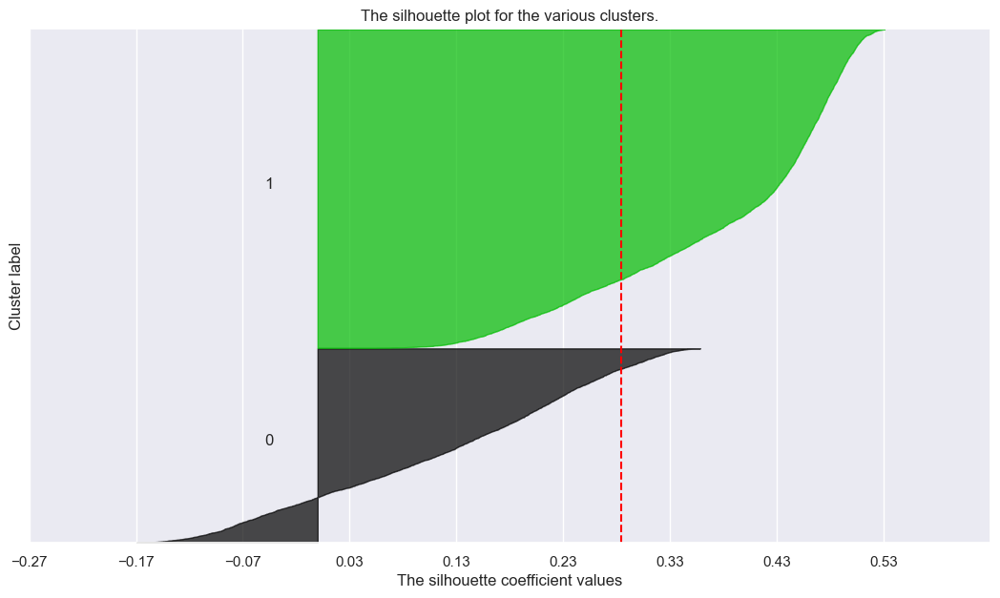

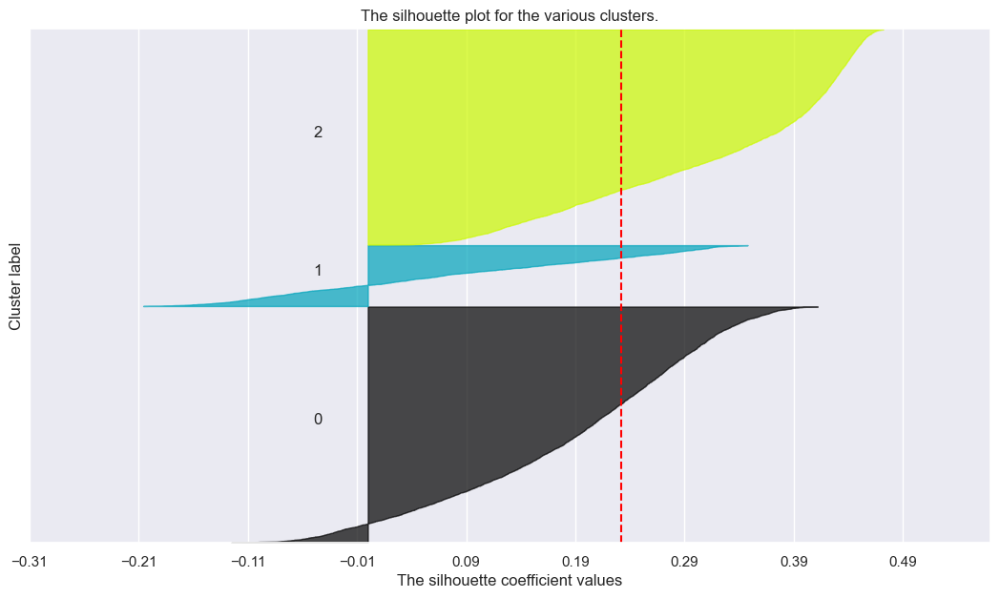

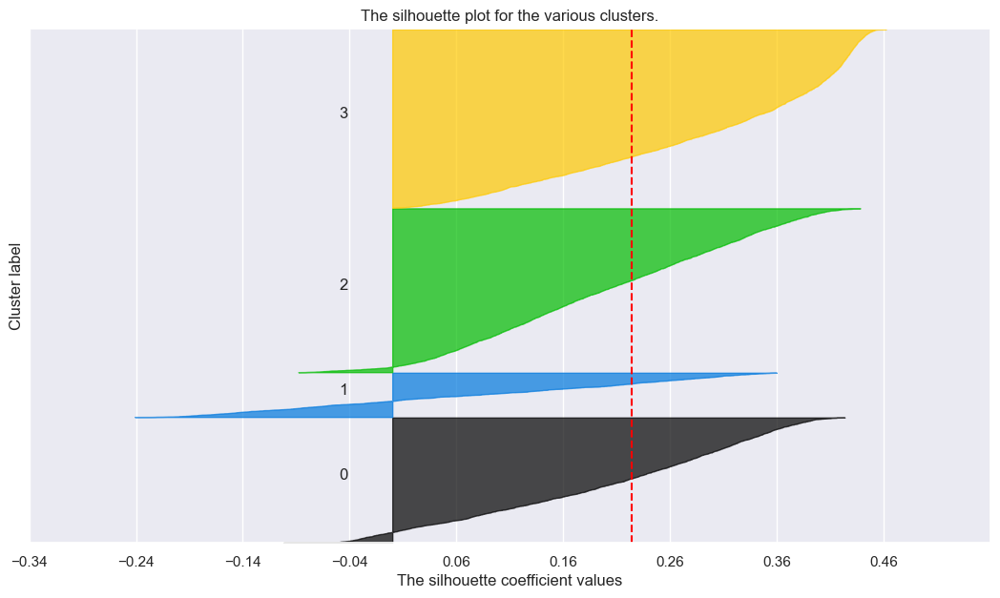

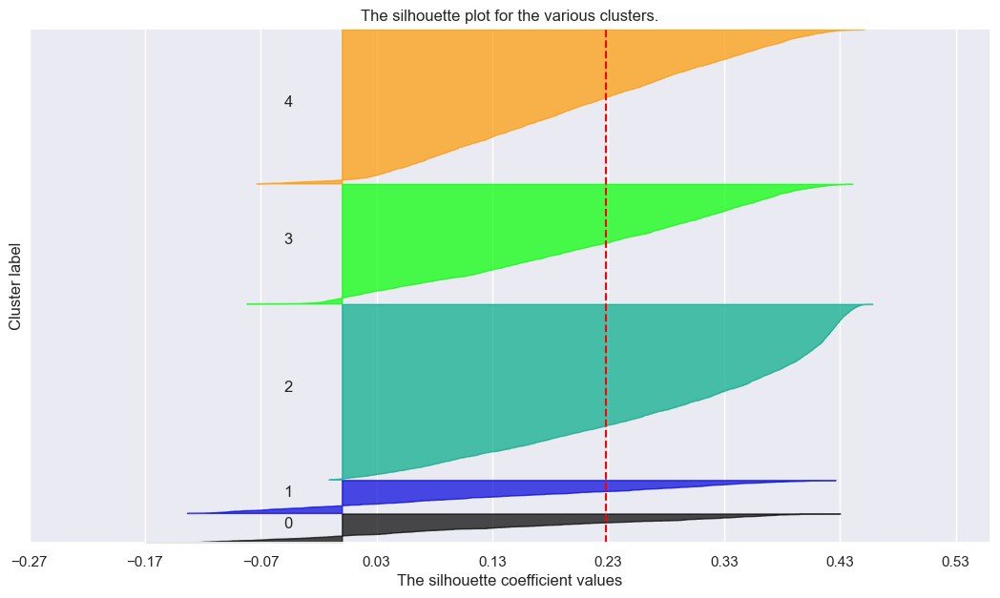

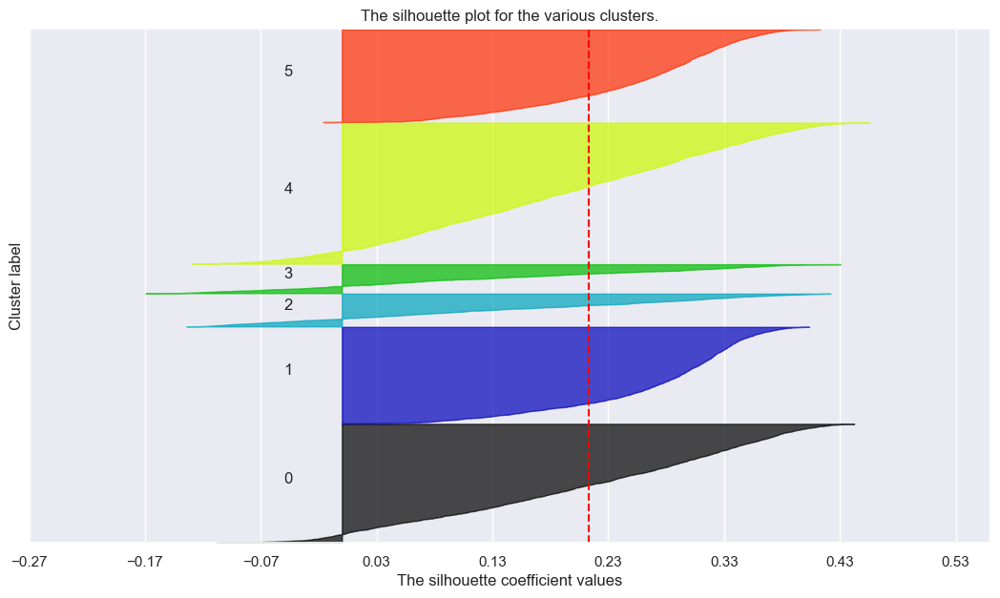

In [230]:
range_clusters = range(2, 7)

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kproto = KPrototypes(n_clusters=nclus, init='Cao',verbose=2, random_state=1)
    cluster_labels = kproto.fit_predict(dfInsurance,categorical=[5])
    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfInsurance, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfInsurance, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(dfInsurance) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

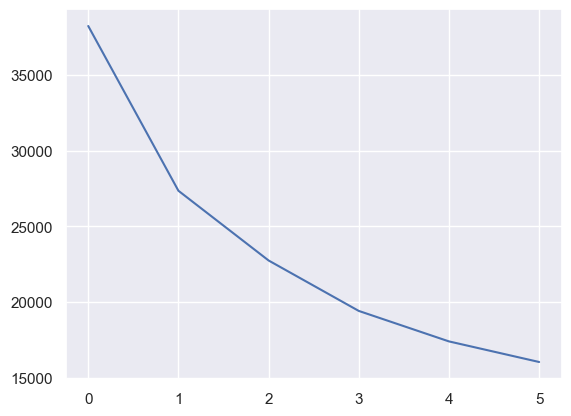

In [231]:
range_clusters = range(1, 7)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KPrototypes(n_clusters=n_clus, init='Cao', n_init=15, random_state=1)
    kmclust.fit(dfInsurance.values, categorical = [5]) #specifying the indices of the categorical features
    inertia.append(kmclust.cost_)  # save the cost of the given cluster solution

plt.plot(inertia)

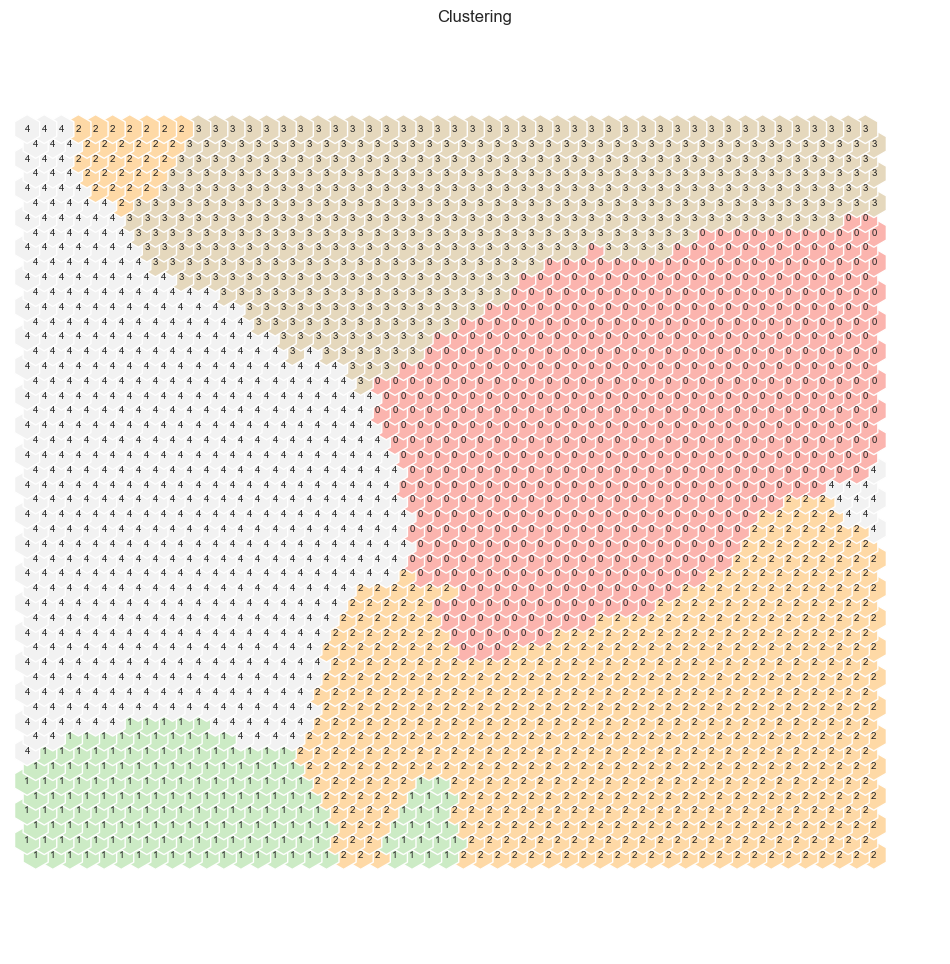

In [9]:
# Initialize the KPrototypes clustering model with 4 clusters,
# using the 'Cao' initialization method and 15 initializations
kproto = KPrototypes(n_clusters=5, init='Cao', n_init=15, random_state=42)

# Fit the model to the data using the node vectors from the SOM
nodeclus_labels = kproto.fit_predict(sm.codebook.matrix, categorical=[5])

# Set the cluster labels of the SOM object to the labels generated by KPrototypes
sm.cluster_labels = nodeclus_labels

# Create a HitMapView and show the clusters on the SOM
hits = HitMapView(12, 12, "Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

# We decided to keep 5 clusters


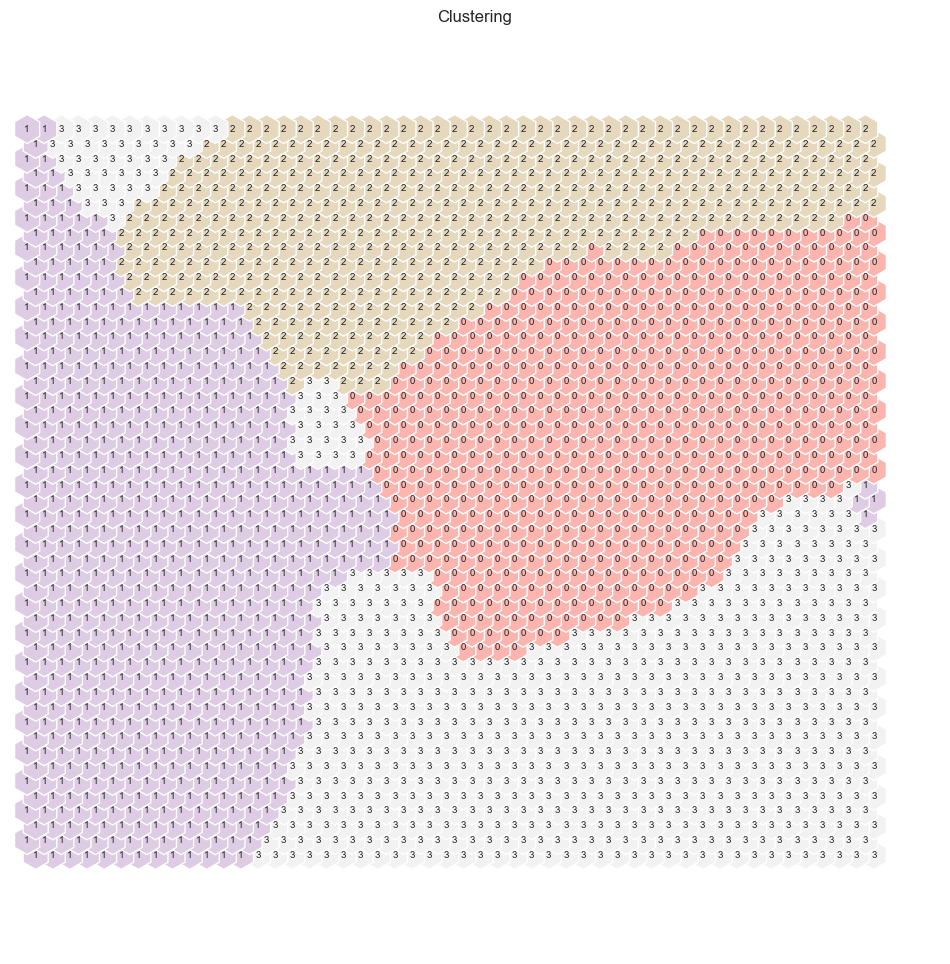

In [204]:
# Initialize the KPrototypes clustering model with 4 clusters,
# using the 'Cao' initialization method and 15 initializations
kproto = KPrototypes(n_clusters=4, init='Cao', n_init=15, random_state=42)

# Fit the model to the data using the node vectors from the SOM
nodeclus_labels = kproto.fit_predict(sm.codebook.matrix, categorical=[5])

# Set the cluster labels of the SOM object to the labels generated by KPrototypes
sm.cluster_labels = nodeclus_labels

# Create a HitMapView and show the clusters on the SOM
hits = HitMapView(12, 12, "Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()


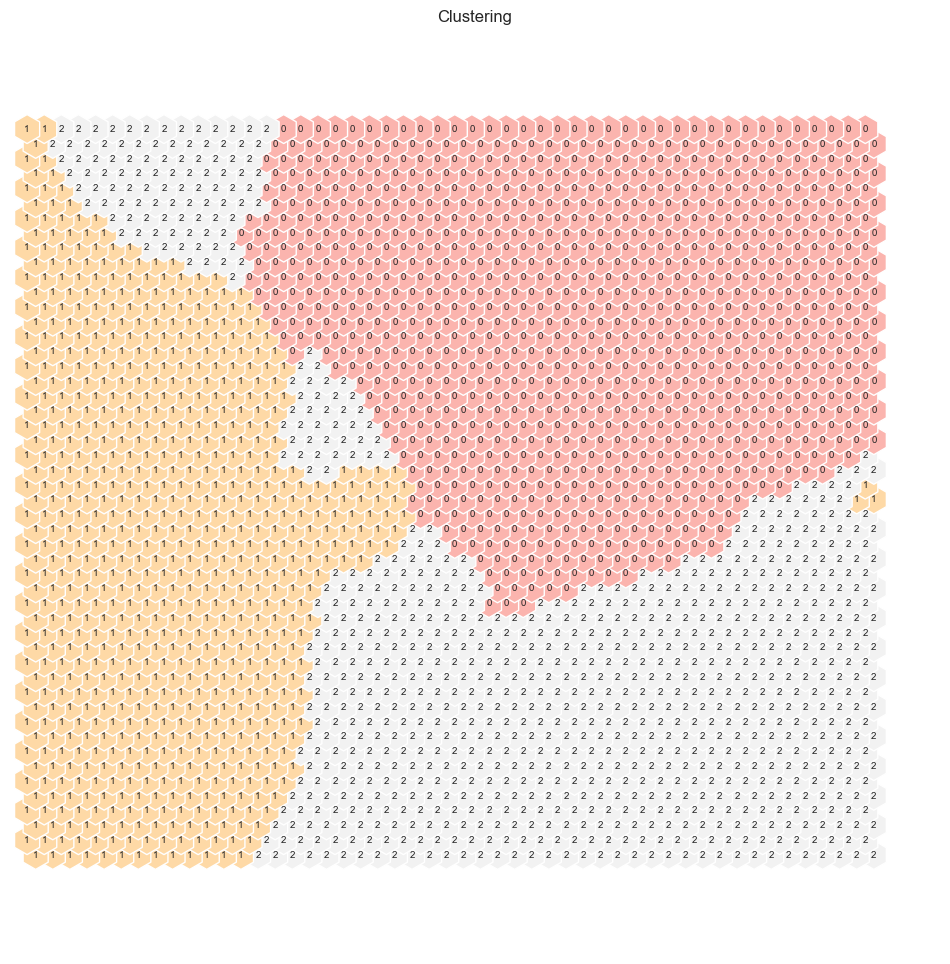

In [43]:
# Initialize the KPrototypes clustering model with 4 clusters,
# using the 'Cao' initialization method and 15 initializations
kproto = KPrototypes(n_clusters=3, init='Cao', n_init=15, random_state=42)

# Fit the model to the data using the node vectors from the SOM
nodeclus_labels_insurance = kproto.fit_predict(sm.codebook.matrix, categorical=[5])

# Set the cluster labels of the SOM object to the labels generated by KPrototypes
sm.cluster_labels = nodeclus_labels_insurance

# Create a HitMapView and show the clusters on the SOM
hits = HitMapView(12, 12, "Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()


In [44]:
nodes_insurance = sm.codebook.matrix

df_nodes_insurance = pd.DataFrame(nodes_insurance, columns=dfInsurance.columns) #values of the nodes for the features that I have and the id
df_nodes_insurance['label_insurance'] = nodeclus_labels_insurance #for each node I have a cluster label
df_nodes_insurance

,MotorPercentageSpent,HouseholdPercentageSpent,HealthPercentageSpent,LifePercentageSpent,WorkPercentageSpent,Cancelled_1,ClaimsRate,label_insurance
0,2.103552,-1.371660,-1.426023,-0.876221,-0.881151,1.896371,-1.727942,0
1,1.994610,-1.333139,-1.285415,-0.843575,-0.837891,1.896371,-1.679855,0
2,1.916622,-1.375115,-1.092325,-0.786567,-0.774687,1.896370,-1.609377,0
3,1.834349,-1.414463,-0.936562,-0.709594,-0.649213,1.896369,-1.550248,0
4,1.725664,-1.414189,-0.785756,-0.660784,-0.508455,1.896367,-1.462732,0
...,...,...,...,...,...,...,...,...
2495,-1.302555,-0.283944,-0.312185,3.686604,3.734727,-0.208334,0.566676,1
2496,-1.138823,-0.431608,-0.118015,3.026567,3.803588,-0.092137,0.445482,1
2497,-1.101279,-0.399608,-0.135142,2.384297,4.191930,-0.197973,0.177941,1
2498,-1.122320,-0.389061,-0.178153,1.916942,4.792669,-0.173250,0.157498,1


In [45]:
bmus_map_ins = sm.find_bmu(dfInsurance.values)[0]  # get bmus for each observation in df

df_bmus_ins = pd.DataFrame(
    np.concatenate((dfInsurance, np.expand_dims(bmus_map_ins,1)), axis=1),
    index=dfInsurance.index, columns=np.append(dfInsurance.columns,"BMU"))


In [46]:
# Get cluster labels for each observation
df_final_insurance = df_bmus_ins.merge(df_nodes_insurance['label_insurance'], 'left', left_on="BMU", right_index=True)
df_final_insurance

,MotorPercentageSpent,HouseholdPercentageSpent,HealthPercentageSpent,LifePercentageSpent,WorkPercentageSpent,Cancelled_1,ClaimsRate,BMU,label_insurance
CustID,,,,,,,,,
1.0,0.357075,-0.257555,0.012021,0.619809,-0.177071,0.0,-0.559322,437.0,2
2.0,-0.865761,0.978485,-0.588569,3.104708,1.449848,0.0,0.677966,2391.0,1
3.0,-0.372926,0.415420,-0.326120,1.419295,1.756908,0.0,-0.745763,2143.0,1
4.0,-0.308089,-0.430432,1.962267,0.414575,0.212183,0.0,0.457627,1954.0,2
5.0,0.289338,-0.416528,0.471710,-0.089648,0.545922,0.0,0.305085,2070.0,2
...,...,...,...,...,...,...,...,...,...
10292.0,0.482015,-0.412452,0.345732,-0.343630,-0.218839,0.0,0.406780,1667.0,2
10293.0,-0.844494,1.956734,-0.771494,-0.452065,0.681850,0.0,-1.220339,846.0,1
10294.0,0.395354,0.003804,-0.089986,-0.292254,-0.504747,0.0,-0.864407,630.0,0


In [47]:
# Characterizing the final clusters
df_final_insurance.drop(columns='BMU').groupby('label_insurance').mean().T

label_insurance,0,1,2
MotorPercentageSpent,0.793705,-0.555206,-0.066508
HouseholdPercentageSpent,-0.418289,0.912327,-0.067193
HealthPercentageSpent,-0.402101,-0.241590,0.713303
LifePercentageSpent,-0.329662,0.935171,0.269264
WorkPercentageSpent,-0.346639,0.877275,0.307304
Cancelled_1,0.467144,0.032730,0.171207
ClaimsRate,-0.201625,-0.096632,0.058807


In [ ]:
## Visualization of CLusters - Histograms

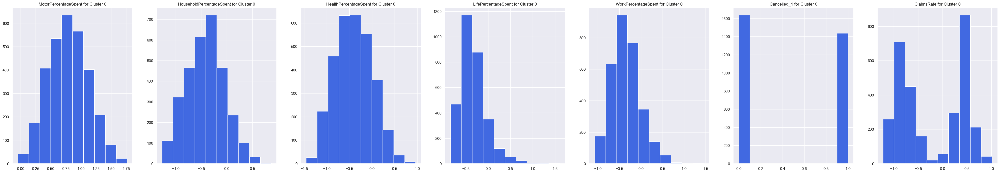

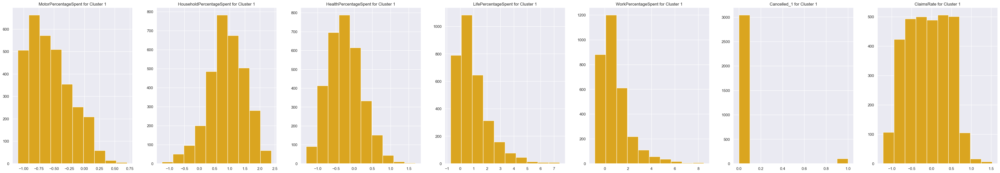

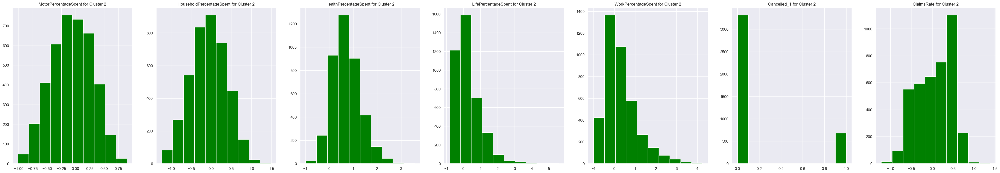

In [49]:
# Defining a list of columns to plot
columns = ['MotorPercentageSpent','HouseholdPercentageSpent','HealthPercentageSpent', 'LifePercentageSpent'
, 'WorkPercentageSpent', 'Cancelled_1', 'ClaimsRate']

# Defining a list of colors to use
colors = ['royalblue', 'goldenrod', 'green']

# Loop through the clusters and plot histograms
for cluster, color in enumerate(colors):
    fig, axs = plt.subplots(nrows=1, ncols=7, figsize=(50,8))
    for ax, col in zip(axs, columns):
        ax.hist(df_final_insurance[col].loc[df_final_insurance['label_insurance'] == cluster], color=color)
        ax.set_title(f"{col} for Cluster {cluster}")
    plt.show()

In [ ]:
## Decision Trees

In [ ]:
# Preparing the data
X = df.drop(columns=['gmm_labels_insurance','gmm_labels_demographic','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

#### dfDemographic

In [15]:
#This som implementation does not have a random seed parameter
# We're going to set it up ourselves

# First, we will turn our data into SOM using a 

np.random.seed(42)

sm = sompy.SOMFactory().build(
    data = dfDemographic.values, # numpy arraywith the values of the dataframe 
    mapsize=[50, 50], # number of nodes in the grid
    initialization='random', # method used to initialize the weights of the SOM.
    neighborhood='gaussian', # type of neighborhood function used in the training process
    training='batch', #training algorithm used
    lattice='hexa', #type of connection that we want; hexa - hexagonal / rect - rectangle - the hexagonal can fit better to the data
    component_names=dfDemographic.columns
)
sm.train(n_job=-1, verbose='info', train_rough_len=50, train_finetune_len=50)



 Training...
 random_initialization took: 0.002000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 50

 epoch: 1 ---> elapsed time:  0.988000, quantization error: 0.946144

 epoch: 2 ---> elapsed time:  0.979000, quantization error: 2.329801

 epoch: 3 ---> elapsed time:  1.048000, quantization error: 2.290211

 epoch: 4 ---> elapsed time:  1.600000, quantization error: 2.281706

 epoch: 5 ---> elapsed time:  1.534000, quantization error: 2.276901

 epoch: 6 ---> elapsed time:  1.821000, quantization error: 2.273230

 epoch: 7 ---> elapsed time:  1.888000, quantization error: 2.269942

 epoch: 8 ---> elapsed time:  1.391000, quantization error: 2.266757

 epoch: 9 ---> elapsed time:  1.048000, quantization error: 2.263031

 epoch: 10 ---> elapsed time:  1.081000, quantization error: 2.258635

 epoch: 11 ---> elapsed time:  0.942000, quantization error: 2.254346

 epoch: 12 ---> elapsed time:  1.492000, quantization error: 2.250510

 epoch: 13 ---> 

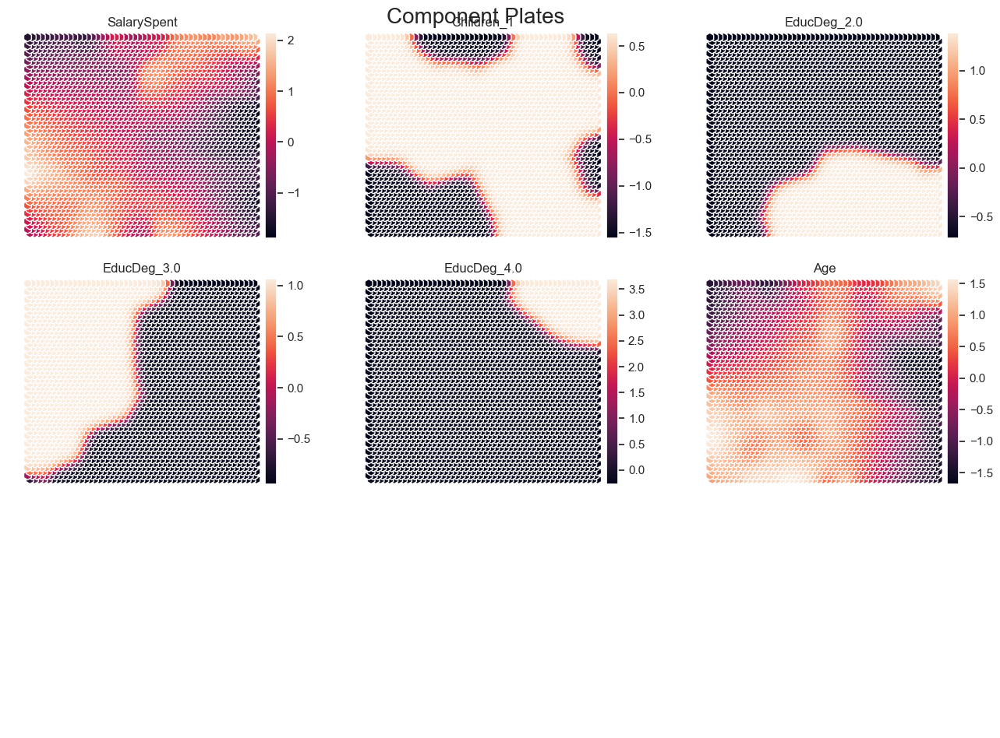

In [211]:
#Components Plates
#The components map shows the values of the variables for each prototype and allows us to extract conclusions consisting of non-linear patterns between variables.
sns.set()
view2D = View2D(100,100,"", text_size=2.8)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.95)
plt.suptitle("Component Plates", fontsize=20)
plt.show()

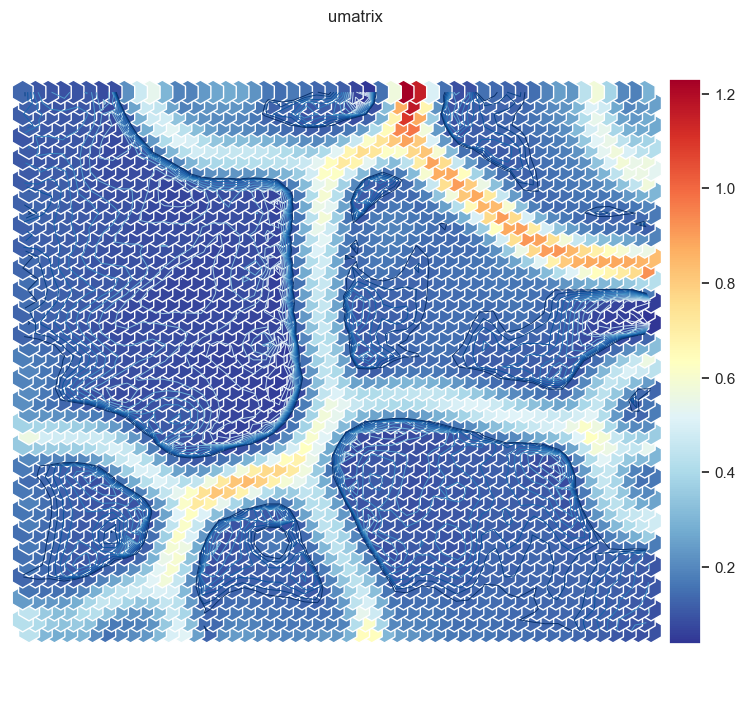

In [212]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(10, 10, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)



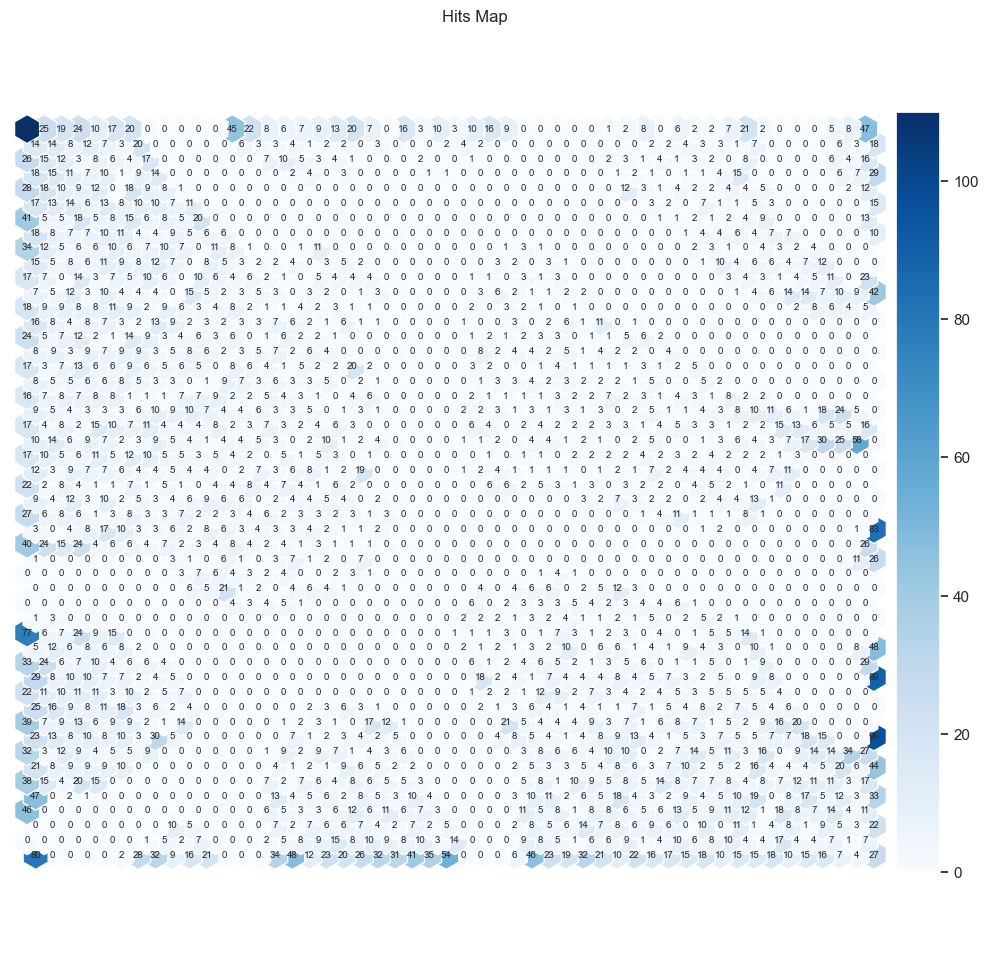

In [213]:
# Hit-Map
#Shows the frequency of each Unit in the output map
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")
plt.show()

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2794, ncost: 6489.65980557965
Run: 1, iteration: 2/100, moves: 171, ncost: 6487.0333660944325
Run: 1, iteration: 3/100, moves: 49, ncost: 6486.533997894754
Run: 1, iteration: 4/100, moves: 20, ncost: 6486.462572491545
Run: 1, iteration: 5/100, moves: 5, ncost: 6486.454173142345
Run: 1, iteration: 6/100, moves: 4, ncost: 6486.451017196836
Run: 1, iteration: 7/100, moves: 0, ncost: 6486.451017196836
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 1435, ncost: 6526.22206365021
Run: 2, iteration: 2/100, moves: 454, ncost: 6491.199489834492
Run: 2, iteration: 3/100, moves: 139, ncost: 6487.358558873557
Run: 2, iteration: 4/100, moves: 56, ncost: 6486.618943372264
Run: 2, iteration: 5/100, moves: 26, ncost: 6486.4797184159015
Run: 2, iteratio

Run: 3, iteration: 6/100, moves: 32, ncost: 5087.7091612706945
Run: 3, iteration: 7/100, moves: 11, ncost: 5087.690514870352
Run: 3, iteration: 8/100, moves: 10, ncost: 5087.672789734083
Run: 3, iteration: 9/100, moves: 10, ncost: 5087.6605004150215
Run: 3, iteration: 10/100, moves: 1, ncost: 5087.660300637892
Run: 3, iteration: 11/100, moves: 0, ncost: 5087.660300637892
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 4, iteration: 1/100, moves: 2566, ncost: 5344.614083261591
Run: 4, iteration: 2/100, moves: 1360, ncost: 5151.569935857615
Run: 4, iteration: 3/100, moves: 688, ncost: 5102.14842643865
Run: 4, iteration: 4/100, moves: 301, ncost: 5091.85192008523
Run: 4, iteration: 5/100, moves: 162, ncost: 5088.682418267929
Run: 4, iteration: 6/100, moves: 76, ncost: 5088.003474875057
Run: 4, iteration: 7/100, moves: 49, ncost: 5087.7535159960435
Run: 4, iteration: 8/100, moves: 25, ncost: 5087.698382019192
Run: 4, iteration: 9/100, moves: 14, ncost: 

Run: 4, iteration: 4/100, moves: 432, ncost: 3907.220485237014
Run: 4, iteration: 5/100, moves: 136, ncost: 3905.009024210594
Run: 4, iteration: 6/100, moves: 68, ncost: 3904.467321903645
Run: 4, iteration: 7/100, moves: 34, ncost: 3904.3389591433847
Run: 4, iteration: 8/100, moves: 16, ncost: 3904.3185163835624
Run: 4, iteration: 9/100, moves: 2, ncost: 3904.317295098868
Run: 4, iteration: 10/100, moves: 6, ncost: 3904.3128139600185
Run: 4, iteration: 11/100, moves: 2, ncost: 3904.312156866656
Run: 4, iteration: 12/100, moves: 2, ncost: 3904.3108953327264
Run: 4, iteration: 13/100, moves: 1, ncost: 3904.3106610930254
Run: 4, iteration: 14/100, moves: 0, ncost: 3904.3106610930254
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 5, iteration: 1/100, moves: 2686, ncost: 4064.6065186707783
Run: 5, iteration: 2/100, moves: 1362, ncost: 3925.1955103637715
Run: 5, iteration: 3/100, moves: 436, ncost: 3907.950758812508
Run: 5, iteration: 4/100, moves: 163, 

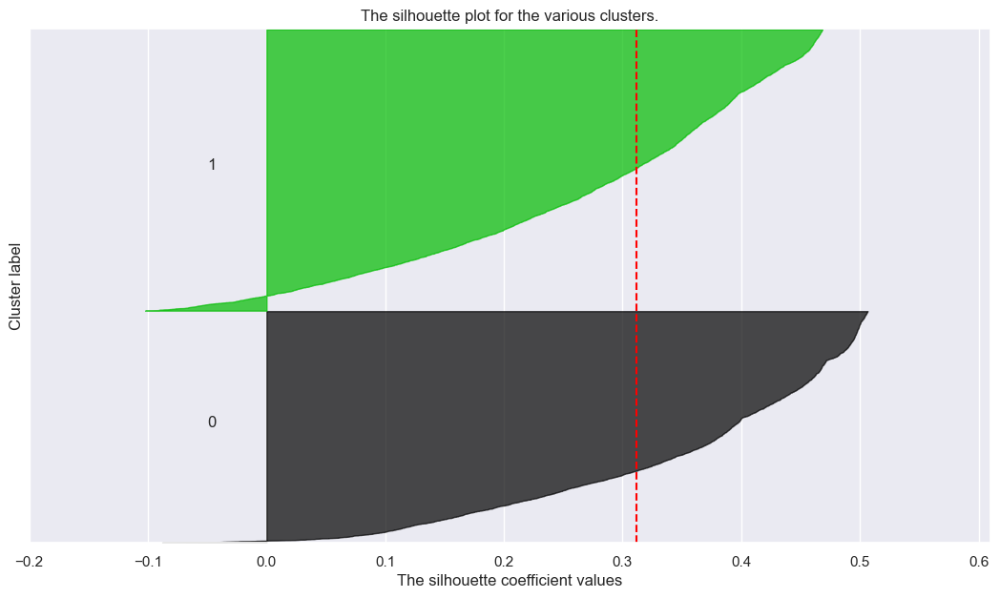

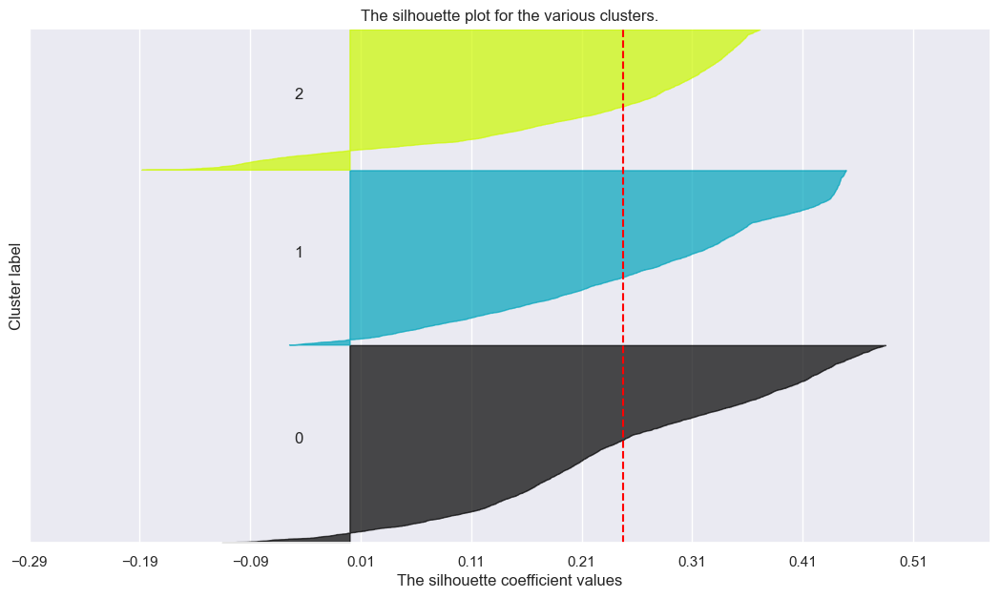

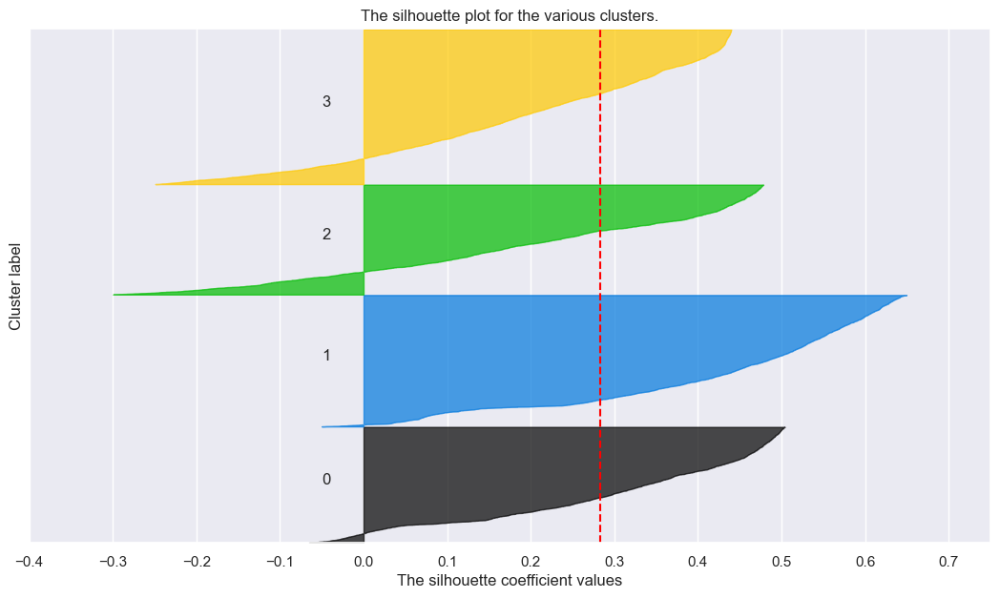

In [201]:
range_clusters = range(1, 7)

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KPrototypes object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kproto = KPrototypes(n_clusters=nclus, init='Cao',verbose=2, random_state=1)
    cluster_labels = kproto.fit_predict(dfDemographic,categorical=[1,2,3,4])
    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfDemographic, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfDemographic, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(dfDemographic) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

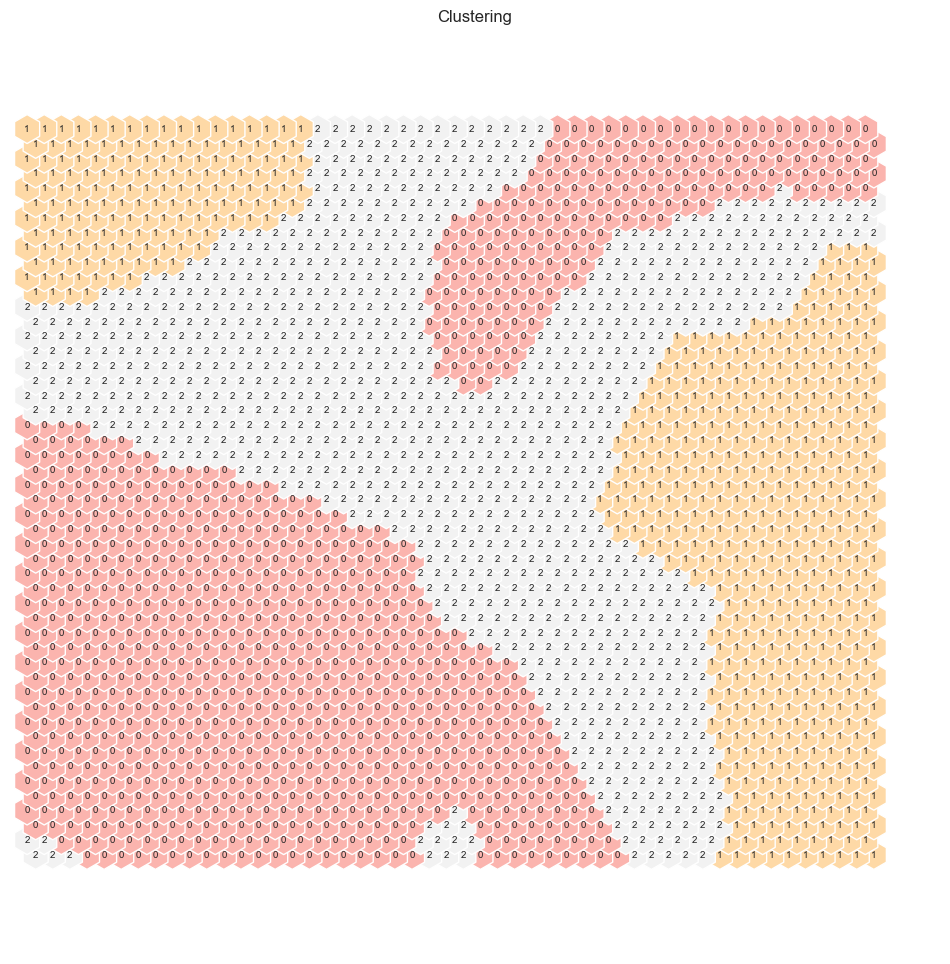

In [16]:
# Initialize the KPrototypes clustering model with 4 clusters,
# using the 'Cao' initialization method and 15 initializations
kproto = KPrototypes(n_clusters=3, init='Cao', n_init=15, random_state=42)

# Fit the model to the data using the node vectors from the SOM
nodeclus_labels_demographic = kproto.fit_predict(sm.codebook.matrix, categorical=[1,2,3,4])

# Set the cluster labels of the SOM object to the labels generated by KPrototypes
sm.cluster_labels = nodeclus_labels_demographic

# Create a HitMapView and show the clusters on the SOM
hits = HitMapView(12, 12, "Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [17]:
nodes_demographic = sm.codebook.matrix

df_nodes_demographic = pd.DataFrame(nodes_demographic, columns=dfDemographic.columns) #values of the nodes for the features that I have and the id
df_nodes_demographic['label_demographic'] = nodeclus_labels_demographic #for each node I have a cluster label
df_nodes_demographic

,SalarySpent,Children_1,EducDeg_2.0,EducDeg_3.0,EducDeg_4.0,Age,label_demographic
0,1.766154,-1.549779,-0.720014,-0.940525,3.699561,1.404035,0
1,1.620753,-1.534743,-0.720014,-0.940525,3.699557,1.326389,0
2,1.525284,-1.472214,-0.720014,-0.940525,3.699547,1.250302,0
3,1.423476,-1.222766,-0.720014,-0.940525,3.699522,1.175408,0
4,1.312179,-0.548658,-0.720014,-0.940525,3.699488,1.069180,0
...,...,...,...,...,...,...,...
2495,0.412274,-1.556691,-0.717517,-0.515299,-0.270302,1.120676,0
2496,0.184548,-1.556692,-0.718930,-0.294863,-0.270302,1.058260,0
2497,0.000618,-1.556695,-0.719719,-0.338464,-0.270302,1.005327,2
2498,-0.095990,-1.556697,-0.719949,-0.516072,-0.270302,0.970284,2


In [18]:
bmus_map_dem = sm.find_bmu(dfDemographic.values)[0]  # get bmus for each observation in df

df_bmus_dem = pd.DataFrame(
    np.concatenate((dfDemographic, np.expand_dims(bmus_map_dem,1)), axis=1),
    index=dfDemographic.index, columns=np.append(dfDemographic.columns,"BMU"))


In [19]:
# Get cluster labels for each observation
df_final_demographic = df_bmus_dem.merge(df_nodes_demographic['label_demographic'], 'left', left_on="BMU", right_index=True)
df_final_demographic

,SalarySpent,Children_1,EducDeg_2.0,EducDeg_3.0,EducDeg_4.0,Age,BMU,label_demographic
CustID,,,,,,,,
1.0,-0.140650,1.0,1.0,0.0,0.0,-0.482759,2260.0,2
2.0,-1.225286,1.0,1.0,0.0,0.0,-0.965517,2104.0,1
3.0,-0.224922,0.0,0.0,0.0,0.0,-0.103448,376.0,2
4.0,-0.759114,1.0,0.0,1.0,0.0,-0.482759,340.0,1
5.0,-0.341952,1.0,0.0,1.0,0.0,-0.206897,587.0,2
...,...,...,...,...,...,...,...,...
10292.0,0.588033,0.0,0.0,0.0,1.0,0.620690,170.0,0
10293.0,-0.815027,0.0,0.0,0.0,0.0,0.551724,1375.0,2
10294.0,0.254178,1.0,0.0,1.0,0.0,-0.310345,845.0,2


In [20]:
df_final_demographic['label_demographic'].value_counts()

2    4041
0    3314
1    2867
Name: label_demographic, dtype: int64

In [21]:
# Characterizing the final clusters
df_final_demographic.drop(columns='BMU').groupby('label_demographic').mean()

,SalarySpent,Children_1,EducDeg_2.0,EducDeg_3.0,EducDeg_4.0,Age
label_demographic,,,,,,
0,0.651134,0.298129,0.323174,0.515389,0.096862,0.628691
1,-0.839716,0.854901,0.370073,0.357168,0.037670,-0.755854
2,0.002310,0.939619,0.336055,0.511260,0.066073,-0.047948


## Merging clusters using hierarchical clustering

In [23]:
df['label_demographic'] = df_final_demographic['label_demographic'].values
df['label_insurance'] = df_final_insurance['label_insurance'].values

In [24]:
# Centroids of the concatenated cluster labels
df_centroids_som = df.groupby(['label_insurance','label_demographic']).mean()
df_centroids_som

ClaimsRate       Age  MotorPercentageSpent  \
label_insurance label_demographic                                               
0               0                   -0.191645  0.481687              0.773029   
                1                   -0.327083 -0.596295              0.570999   
                2                   -0.194191 -0.078053              0.822585   
1               0                   -0.102577  0.668708             -0.464737   
                1                   -0.073340 -0.827198             -0.719574   
                2                   -0.137672  0.167580             -0.311073   
2               0                    0.064246  0.682551             -0.068374   
                1                    0.057188 -0.678001             -0.216251   
                2                    0.052396 -0.140590              0.071754   

                                   HouseholdPercentageSpent  \
label_insurance label_demographic                             
0               0                                 -0.443580   
                1                                 -0.256506   
                2                                 -0.422802   
1               0                                  0.758450   
                1                                  1.059877   
                2                                  0.761289   
2               0                                 -0.093991   
                1                                  0.059025   
                2                                 -0.142641   

                                   HealthPercentageSpent  LifePercentageSpent  \
label_insurance label_demographic                                               
0               0                              -0.330962            -0.281931   
                1                              -0.156566            -0.284911   
                2                              -0.453689            -0.353266   
1               0                              -0.074993             0.773745   
                1                              -0.266797             1.157118   
                2                              -0.347315             0.642325   
2               0                               0.760775             0.291111   
                1                               0.818847             0.322887   
                2                               0.548995             0.189076   

                                   WorkPercentageSpent  SalarySpent  \
label_insurance label_demographic                                     
0               0                            -0.321686     0.790426   
                1                            -0.291670    -0.623362   
                2                            -0.361875     0.095234   
1               0                             0.704844     0.247967   
                1                             1.150087    -0.973870   
                2                             0.492948    -0.177880   
2               0                             0.299030     0.758416   
                1                             0.397611    -0.678756   
                2                             0.237536    -0.036608   

                                   EducDeg_2.0  EducDeg_3.0  EducDeg_4.0  \
label_insurance label_demographic                                          
0               0                     0.183990     0.606930     0.194743   
                1                     0.117021     0.702128     0.138298   
                2                     0.251830     0.604197     0.102977   
1               0                     0.535381     0.291055     0.020027   
                1                     0.420263     0.202627     0.005003   
                2                     0.478098     0.310388     0.010013   
2               0                     0.298611     0.568287     0.082755   
                1                     0.339815     0.525926     0.068519   
               

In [25]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids_som)

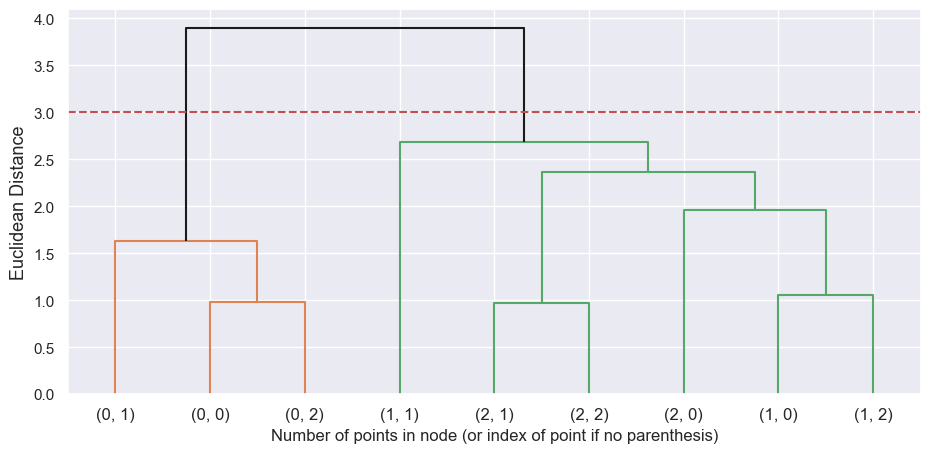

In [26]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids_som.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
#plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [27]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='complete', 
    affinity='euclidean', 
    n_clusters=3
)
hclust_labels = hclust.fit_predict(df_centroids_som)
df_centroids_som['hclust_labels'] = hclust_labels

df_centroids_som  # centroid's cluster labels

ClaimsRate       Age  MotorPercentageSpent  \
label_insurance label_demographic                                               
0               0                   -0.191645  0.481687              0.773029   
                1                   -0.327083 -0.596295              0.570999   
                2                   -0.194191 -0.078053              0.822585   
1               0                   -0.102577  0.668708             -0.464737   
                1                   -0.073340 -0.827198             -0.719574   
                2                   -0.137672  0.167580             -0.311073   
2               0                    0.064246  0.682551             -0.068374   
                1                    0.057188 -0.678001             -0.216251   
                2                    0.052396 -0.140590              0.071754   

                                   HouseholdPercentageSpent  \
label_insurance label_demographic                             
0               0                                 -0.443580   
                1                                 -0.256506   
                2                                 -0.422802   
1               0                                  0.758450   
                1                                  1.059877   
                2                                  0.761289   
2               0                                 -0.093991   
                1                                  0.059025   
                2                                 -0.142641   

                                   HealthPercentageSpent  LifePercentageSpent  \
label_insurance label_demographic                                               
0               0                              -0.330962            -0.281931   
                1                              -0.156566            -0.284911   
                2                              -0.453689            -0.353266   
1               0                              -0.074993             0.773745   
                1                              -0.266797             1.157118   
                2                              -0.347315             0.642325   
2               0                               0.760775             0.291111   
                1                               0.818847             0.322887   
                2                               0.548995             0.189076   

                                   WorkPercentageSpent  SalarySpent  \
label_insurance label_demographic                                     
0               0                            -0.321686     0.790426   
                1                            -0.291670    -0.623362   
                2                            -0.361875     0.095234   
1               0                             0.704844     0.247967   
                1                             1.150087    -0.973870   
                2                             0.492948    -0.177880   
2               0                             0.299030     0.758416   
                1                             0.397611    -0.678756   
                2                             0.237536    -0.036608   

                                   EducDeg_2.0  EducDeg_3.0  EducDeg_4.0  \
label_insurance label_demographic                                          
0               0                     0.183990     0.606930     0.194743   
                1                     0.117021     0.702128     0.138298   
                2                     0.251830     0.604197     0.102977   
1               0                     0.535381     0.291055     0.020027   
                1                     0.420263     0.202627     0.005003   
                2                     0.478098     0.310388     0.010013   
2               0                     0.298611     0.568287     0.082755   
                1                     0.339815     0.525926     0.068519   
               

In [28]:
df_centroids_som['hclust_labels'].to_dict()

{(0, 0): 0,
 (0, 1): 0,
 (0, 2): 0,
 (1, 0): 2,
 (1, 1): 1,
 (1, 2): 2,
 (2, 0): 2,
 (2, 1): 0,
 (2, 2): 0}

In [29]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids_som['hclust_labels'].to_dict()

df_ = df.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['label_insurance'], row['label_demographic'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean().T



merged_labels,0,1,2
ClaimsRate,-0.092674,-0.073340,-0.023142
Age,-0.143787,-0.827198,0.553787
MotorPercentageSpent,0.428633,-0.719574,-0.218189
HouseholdPercentageSpent,-0.260378,1.059877,0.309503
HealthPercentageSpent,0.056714,-0.266797,0.299434
LifePercentageSpent,-0.082120,1.157118,0.487116
WorkPercentageSpent,-0.065975,1.150087,0.439108
SalarySpent,-0.006957,-0.973870,0.413353
EducDeg_2.0,0.284085,0.420263,0.396520
EducDeg_3.0,0.565925,0.202627,0.442002


In [30]:
df = df_.copy()

In [31]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

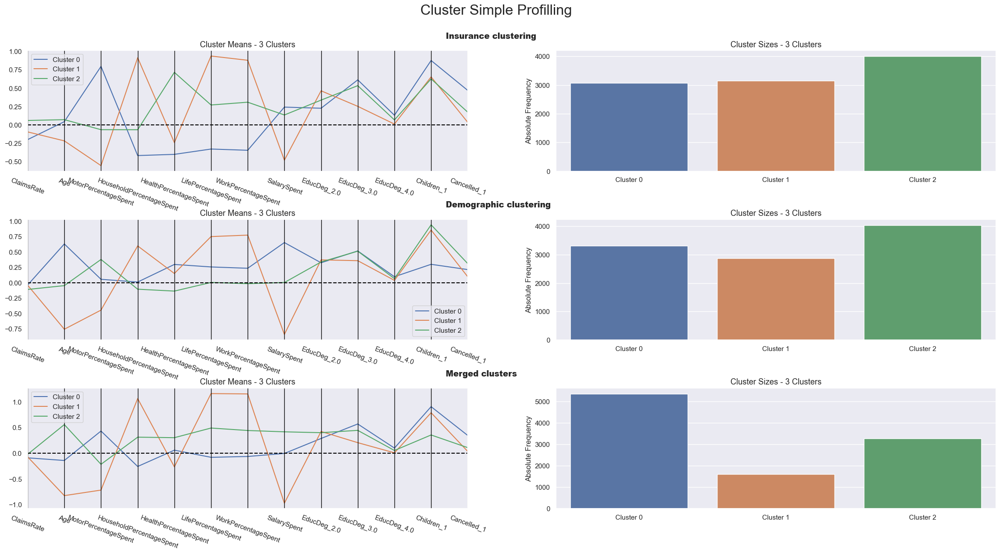

In [32]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df[df.columns.to_list()], 
    label_columns = ['label_insurance', 'label_demographic', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Insurance clustering", "Demographic clustering", "Merged clusters"]
)